# Activity Prediction

In [1]:
import pandas as pd
import rdkit
from rdkit import Chem
from rdkit.Chem import PandasTools

import os
from rdkit import RDConfig
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

In [2]:
pd.set_option('display.max.rows',None) # Full data display

In [3]:
df8 = pd.read_csv('mixx_from_fp.csv')

In [4]:
df8

,Target Name,activity,Binding db,SMILES,bioactivity,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,...,PubchemFP871,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880
0,Replicase polyprotein 1ab,1600.000,36475694,O=C(NCc1cccs1)[C@@H]1CN(C(=O)C(F)(F)S(=O)(=O)F...,intermediate,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Replicase polyprotein 1ab,180.000,36475694,O=C(NCc1cccs1)[C@@H]1CN(C(=O)CCl)CCN1c1ccc(Cl)...,intermediate,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Replicase polyprotein 1ab,310.000,36475694,O=C(NCc1cccs1)[C@@H]1CN(C(=O)CBr)CCN1c1ccc(Cl)...,intermediate,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Replicase polyprotein 1ab,2800.000,36475694,C#CC(=O)N1CCN(c2ccc(Cl)c(Cl)c2)[C@H](C(=O)NCc2...,intermediate,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Replicase polyprotein 1ab,400.000,36475694,O=C(NCc1cccs1)[C@@H]1CN(C(=O)c2cccnc2)CCN1c1cc...,intermediate,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,Replicase polyprotein 1ab,5100.000,36475694,O=C(c1cc(=O)[nH]c(=O)[nH]1)N1CCN(c2ccc(Cl)c(Cl...,inactive,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,Replicase polyprotein 1ab,92.000,36475694,CC(C)(C)[C@H](NC(=O)C(F)(F)F)C(=O)N1C[C@H]2[C@...,active,1.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,Replicase polyprotein 1ab,0.270,36475694,COc1cccc2[nH]c(C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H...,active,1.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,Replicase polyprotein 1ab,530.000,36475694,O=C[C@H](C[C@@H]1CCNC1=O)NC(=O)[C@H](CC1CCCCC1...,intermediate,1.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,Replicase polyprotein 1ab,670.000,36475694,O=c1c2ccccc2[se]n1-c1ccccc1,intermediate,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
df8=df8.drop('Target Name',axis=1)

In [6]:
df88=df8.drop( 'Binding db',axis=1)

In [7]:
df88


,activity,SMILES,bioactivity,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,...,PubchemFP871,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880
0,1600.000,O=C(NCc1cccs1)[C@@H]1CN(C(=O)C(F)(F)S(=O)(=O)F...,intermediate,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,180.000,O=C(NCc1cccs1)[C@@H]1CN(C(=O)CCl)CCN1c1ccc(Cl)...,intermediate,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,310.000,O=C(NCc1cccs1)[C@@H]1CN(C(=O)CBr)CCN1c1ccc(Cl)...,intermediate,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2800.000,C#CC(=O)N1CCN(c2ccc(Cl)c(Cl)c2)[C@H](C(=O)NCc2...,intermediate,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,400.000,O=C(NCc1cccs1)[C@@H]1CN(C(=O)c2cccnc2)CCN1c1cc...,intermediate,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,5100.000,O=C(c1cc(=O)[nH]c(=O)[nH]1)N1CCN(c2ccc(Cl)c(Cl...,inactive,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,92.000,CC(C)(C)[C@H](NC(=O)C(F)(F)F)C(=O)N1C[C@H]2[C@...,active,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.270,COc1cccc2[nH]c(C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H...,active,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,530.000,O=C[C@H](C[C@@H]1CCNC1=O)NC(=O)[C@H](CC1CCCCC1...,intermediate,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,670.000,O=c1c2ccccc2[se]n1-c1ccccc1,intermediate,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [8]:
df9 = df88.replace(to_replace=['active', 'intermediate', 'inactive'], value=[0, 1, 2])

In [9]:
df9

,activity,SMILES,bioactivity,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,...,PubchemFP871,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880
0,1600.000,O=C(NCc1cccs1)[C@@H]1CN(C(=O)C(F)(F)S(=O)(=O)F...,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,180.000,O=C(NCc1cccs1)[C@@H]1CN(C(=O)CCl)CCN1c1ccc(Cl)...,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,310.000,O=C(NCc1cccs1)[C@@H]1CN(C(=O)CBr)CCN1c1ccc(Cl)...,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2800.000,C#CC(=O)N1CCN(c2ccc(Cl)c(Cl)c2)[C@H](C(=O)NCc2...,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,400.000,O=C(NCc1cccs1)[C@@H]1CN(C(=O)c2cccnc2)CCN1c1cc...,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,5100.000,O=C(c1cc(=O)[nH]c(=O)[nH]1)N1CCN(c2ccc(Cl)c(Cl...,2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,92.000,CC(C)(C)[C@H](NC(=O)C(F)(F)F)C(=O)N1C[C@H]2[C@...,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.270,COc1cccc2[nH]c(C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H...,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,530.000,O=C[C@H](C[C@@H]1CCNC1=O)NC(=O)[C@H](CC1CCCCC1...,1,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,670.000,O=c1c2ccccc2[se]n1-c1ccccc1,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
df9.bioactivity

0      1
1      1
2      1
3      1
4      1
5      2
6      0
7      0
8      1
9      1
10     0
11     0
12     2
13     1
14     2
15     2
16     2
17     2
18     2
19     2
20     1
21     1
22     2
23     2
24     2
25     2
26     2
27     2
28     2
29     1
30     2
31     2
32     2
33     2
34     1
35     1
36     1
37     2
38     1
39     2
40     2
41     1
42     1
43     2
44     1
45     1
46     1
47     1
48     1
49     1
50     1
51     1
52     1
53     1
54     1
55     1
56     1
57     1
58     1
59     1
60     1
61     1
62     1
63     1
64     1
65     1
66     1
67     2
68     2
69     2
70     2
71     2
72     2
73     2
74     2
75     2
76     2
77     2
78     2
79     2
80     1
81     2
82     2
83     2
84     2
85     2
86     2
87     2
88     2
89     1
90     2
91     2
92     2
93     2
94     2
95     1
96     1
97     2
98     1
99     2
100    1
101    1
102    2
103    2
104    2
105    2
106    2
107    2
108    2
109    1
110    1
1

In [11]:
df9.head(2)

,activity,SMILES,bioactivity,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,...,PubchemFP871,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880
0,1600.0,O=C(NCc1cccs1)[C@@H]1CN(C(=O)C(F)(F)S(=O)(=O)F...,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,180.0,O=C(NCc1cccs1)[C@@H]1CN(C(=O)CCl)CCN1c1ccc(Cl)...,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
df10=df9.drop('SMILES',axis=1)

In [13]:
df10

,activity,bioactivity,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,...,PubchemFP871,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880
0,1600.000,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,180.000,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,310.000,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2800.000,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,400.000,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,5100.000,2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,92.000,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.270,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,530.000,1,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,670.000,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [14]:
#To know the number of unique values in a particulat column
#df10.bioactivity.value_counts()

In [15]:
len(df10)

884

In [16]:
df10

,activity,bioactivity,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,...,PubchemFP871,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880
0,1600.000,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,180.000,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,310.000,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2800.000,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,400.000,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,5100.000,2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,92.000,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.270,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,530.000,1,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,670.000,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# IC50 to pIC50

In [17]:
import numpy as np

def pIC50(input):
    pIC50 = []

    for i in input['activity_norm']:
        molar = i*(10**-9) # Converts nM to M
        pIC50.append(-np.log10(molar))

    input['pIC50'] = pIC50
    x = input.drop('activity_norm', 1)
        
    return x

In [18]:
df10.activity.describe()

count    8.840000e+02
mean     2.538614e+04
std      9.276075e+04
min      1.300000e-02
25%      3.675000e+02
50%      4.100000e+03
75%      1.759750e+04
max      2.000000e+06
Name: activity, dtype: float64

In [19]:
def norm_value(input):
    norm = []

    for i in input['activity']:
        if i > 100000000:
          i = 100000000
        norm.append(i)

    input['activity_norm'] = norm
    x = input.drop('activity', 1)
        
    return x

In [20]:
dfAct=norm_value(df10)
dfAct

C:\Users\USER\AppData\Local\Temp\ipykernel_7216\3071571992.py:10: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  x = input.drop('activity', 1)


,bioactivity,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,...,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880,activity_norm
0,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1600.000
1,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,180.000
2,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,310.000
3,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2800.000
4,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,400.000
5,2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5100.000
6,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,92.000
7,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.270
8,1,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,530.000
9,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,670.000


In [21]:
dfAct.activity_norm.describe()

count    8.840000e+02
mean     2.538614e+04
std      9.276075e+04
min      1.300000e-02
25%      3.675000e+02
50%      4.100000e+03
75%      1.759750e+04
max      2.000000e+06
Name: activity_norm, dtype: float64

In [22]:
df11 = pIC50(dfAct)
df11

C:\Users\USER\AppData\Local\Temp\ipykernel_7216\1973795238.py:11: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  x = input.drop('activity_norm', 1)


,bioactivity,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,...,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880,pIC50
0,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.795880
1,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.744727
2,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.508638
3,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.552842
4,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.397940
5,2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.292430
6,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.036212
7,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.568636
8,1,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.275724
9,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.173925


In [23]:
df11.pIC50.describe()

count    884.000000
mean       5.636672
std        1.212341
min        2.698970
25%        4.754559
50%        5.387216
75%        6.434773
max       10.886057
Name: pIC50, dtype: float64

In [24]:
df11.bioactivity.value_counts()

2    416
1    326
0    142
Name: bioactivity, dtype: int64

# To know the number of unique values in a particulat column

In [25]:
df11.bioactivity.value_counts()

2    416
1    326
0    142
Name: bioactivity, dtype: int64

# NULL values

In [26]:
df11.isna().sum()

bioactivity     0
PubchemFP0      2
PubchemFP1      2
PubchemFP2      2
PubchemFP3      2
PubchemFP4      2
PubchemFP5      2
PubchemFP6      2
PubchemFP7      2
PubchemFP8      2
PubchemFP9      2
PubchemFP10     2
PubchemFP11     2
PubchemFP12     2
PubchemFP13     2
PubchemFP14     2
PubchemFP15     2
PubchemFP16     2
PubchemFP17     2
PubchemFP18     2
PubchemFP19     2
PubchemFP20     2
PubchemFP21     2
PubchemFP22     2
PubchemFP23     2
PubchemFP24     2
PubchemFP25     2
PubchemFP26     2
PubchemFP27     2
PubchemFP28     2
PubchemFP29     2
PubchemFP30     2
PubchemFP31     2
PubchemFP32     2
PubchemFP33     2
PubchemFP34     2
PubchemFP35     2
PubchemFP36     2
PubchemFP37     2
PubchemFP38     2
PubchemFP39     2
PubchemFP40     2
PubchemFP41     2
PubchemFP42     2
PubchemFP43     2
PubchemFP44     2
PubchemFP45     2
PubchemFP46     2
PubchemFP47     2
PubchemFP48     2
PubchemFP49     2
PubchemFP50     2
PubchemFP51     2
PubchemFP52     2
PubchemFP53     2
PubchemFP5

# Removing the bioactivity '2 to reduce the number'

In [27]:
df12 = df11.dropna()

In [28]:
df12.isna().sum()

bioactivity     0
PubchemFP0      0
PubchemFP1      0
PubchemFP2      0
PubchemFP3      0
PubchemFP4      0
PubchemFP5      0
PubchemFP6      0
PubchemFP7      0
PubchemFP8      0
PubchemFP9      0
PubchemFP10     0
PubchemFP11     0
PubchemFP12     0
PubchemFP13     0
PubchemFP14     0
PubchemFP15     0
PubchemFP16     0
PubchemFP17     0
PubchemFP18     0
PubchemFP19     0
PubchemFP20     0
PubchemFP21     0
PubchemFP22     0
PubchemFP23     0
PubchemFP24     0
PubchemFP25     0
PubchemFP26     0
PubchemFP27     0
PubchemFP28     0
PubchemFP29     0
PubchemFP30     0
PubchemFP31     0
PubchemFP32     0
PubchemFP33     0
PubchemFP34     0
PubchemFP35     0
PubchemFP36     0
PubchemFP37     0
PubchemFP38     0
PubchemFP39     0
PubchemFP40     0
PubchemFP41     0
PubchemFP42     0
PubchemFP43     0
PubchemFP44     0
PubchemFP45     0
PubchemFP46     0
PubchemFP47     0
PubchemFP48     0
PubchemFP49     0
PubchemFP50     0
PubchemFP51     0
PubchemFP52     0
PubchemFP53     0
PubchemFP5

In [29]:
df12.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 882 entries, 0 to 883
Columns: 883 entries, bioactivity to pIC50
dtypes: float64(882), int64(1)
memory usage: 5.9 MB


In [30]:
len(df12)

882

In [31]:
df13 = df12
df13

,bioactivity,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,...,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880,pIC50
0,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.795880
1,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.744727
2,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.508638
3,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.552842
4,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.397940
5,2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.292430
6,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.036212
7,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.568636
8,1,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.275724
9,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.173925


In [32]:
#df13 = df12[df12['bioactivity'] != 2]
#df13

In [33]:
len(df13)

882

In [34]:
df13.bioactivity.value_counts()

2    416
1    324
0    142
Name: bioactivity, dtype: int64

In [35]:
df14=df13.drop( 'bioactivity',axis=1)

In [36]:
df14

,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,...,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880,pIC50
0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.795880
1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.744727
2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.508638
3,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.552842
4,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.397940
5,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.292430
6,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.036212
7,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.568636
8,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.275724
9,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.173925


In [37]:
#df12.bioactivity.value_counts()

In [38]:
#df13 = df12[df12['bioactivity'] != 1]
#df13

In [39]:
#df14

# Model Preparation Linear Regression

In [40]:
X = df14.drop('pIC50', axis=1)
X

,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,...,PubchemFP871,PubchemFP872,PubchemFP873,PubchemFP874,PubchemFP875,PubchemFP876,PubchemFP877,PubchemFP878,PubchemFP879,PubchemFP880
0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [41]:
y = df14.pIC50
y

0       5.795880
1       6.744727
2       6.508638
3       5.552842
4       6.397940
5       5.292430
6       7.036212
7       9.568636
8       6.275724
9       6.173925
10      8.096910
11      7.522879
12      4.960189
13      6.173925
14      5.180456
15      4.583359
16      5.236572
17      5.036212
18      5.130768
19      4.772113
20      5.443697
21      5.795880
22      4.452225
23      4.876148
24      4.507240
25      4.991400
26      5.045757
27      5.102373
28      5.283997
29      5.522879
30      5.013228
31      5.180456
32      4.340084
33      5.275724
34      5.552842
35      5.638272
36      5.387216
37      4.375718
38      6.154902
39      4.995679
40      4.616185
41      6.221849
42      6.301030
43      4.640165
44      6.698970
45      6.552842
46      6.292430
47      6.251812
48      6.180456
49      6.173925
50      6.091515
51      6.026872
52      6.017729
53      5.978811
54      5.829738
55      5.742321
56      5.705534
57      5.669586
58      5.6216

# Low variance

In [42]:
#from sklearn.feature_selection import VarianceThreshold
#selection = VarianceThreshold(threshold=(.8 * (1 - .8)))    
#X = selection.fit_transform(X)

In [43]:
X.shape, y.shape

((882, 881), (882,))

# Data Splitting

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

In [45]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)

In [46]:
X_train.shape, y_train.shape

((705, 881), (705,))

In [47]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# RandomForestRegressor

In [48]:
from sklearn.ensemble import RandomForestRegressor
rfg = RandomForestRegressor
rfg = RandomForestRegressor(n_estimators=250, random_state=123)
rfg.fit(X_train_scaled, y_train)
r2 = rfg.score(X_train_scaled, y_train)
r2

0.9466922880265367

In [49]:
y_pred = rfg.predict(X_test_scaled)
#y_pred

In [50]:
CompareDFs_rfg = pd.DataFrame({'Actual':y_test, 'Predicted': y_pred})
CompareDFs_rfg

,Actual,Predicted
549,5.270835,5.457978
574,6.450997,6.837724
452,5.700929,5.152721
194,7.327902,6.247747
662,4.886057,4.292102
285,7.040959,6.614112
124,6.551294,6.898686
131,7.958607,7.111859
493,5.481486,5.758673
174,8.283997,6.107736


# Model Performance

In [51]:
from sklearn.metrics import mean_squared_error, r2_score
print('Mean squared error (MSE): %.2f'
      % mean_squared_error(y_test, y_pred))
print('Coefficient of determination (R^2): %.2f'
      % r2_score(y_test, y_pred))

Mean squared error (MSE): 0.47
Coefficient of determination (R^2): 0.71


# Graph

In [52]:
import matplotlib.pyplot as plt
import numpy as np

<function matplotlib.pyplot.show(close=None, block=None)>

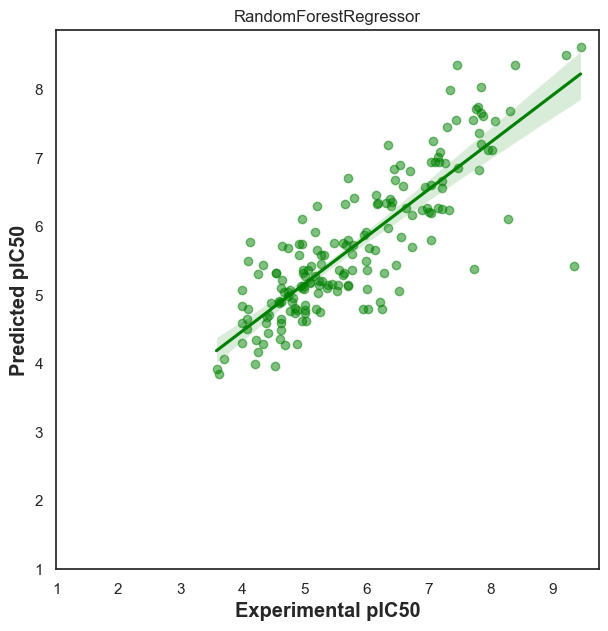

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(color_codes=True)
sns.set_style("white")

ax=sns.regplot(data=CompareDFs_rfg, x="Actual", y="Predicted", scatter_kws={'alpha':0.5}, color="green")
ax.set_xlabel('Experimental pIC50', fontsize='large', fontweight='bold')
ax.set_ylabel('Predicted pIC50', fontsize='large', fontweight='bold')
ax.set_title('RandomForestRegressor')
ax.set_xlim(1, )
ax.set_ylim(1, )
ax.figure.set_size_inches(7, 7)
plt.show

# Linear Regression

In [54]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train_scaled, y_train)
lr2 = lr.score(X_train_scaled, y_train)
lr2

0.9091327655855831

In [55]:
y_pred = lr.predict(X_test_scaled)

In [56]:
#y_pred

In [57]:
CompareDFs_lr = pd.DataFrame({'Actual':y_test, 'Predicted': y_pred})
CompareDFs_lr

,Actual,Predicted
549,5.270835,5.167810e+00
574,6.450997,9.553640e+00
452,5.700929,6.154851e+00
194,7.327902,6.077630e+00
662,4.886057,3.905370e+00
285,7.040959,-6.813265e+12
124,6.551294,7.506749e+00
131,7.958607,7.269407e+00
493,5.481486,6.104299e+00
174,8.283997,7.435888e+00


# Model Performance

In [58]:
from sklearn.metrics import mean_squared_error, r2_score
print('Mean squared error (MSE): %.2f'
      % mean_squared_error(y_test, y_pred))
print('Coefficient of determination (R^2): %.2f'
      % r2_score(y_test, y_pred))

Mean squared error (MSE): 8716639311005450594418688.00
Coefficient of determination (R^2): -5430896914968097432010752.00


<function matplotlib.pyplot.show(close=None, block=None)>

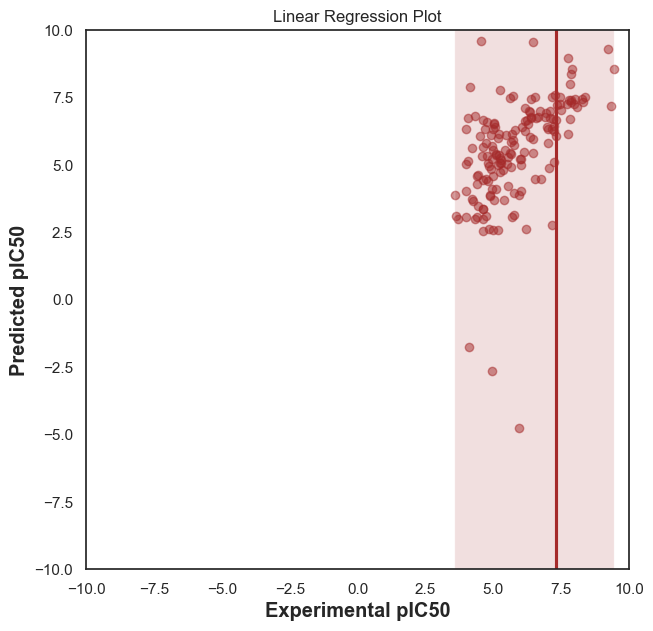

In [59]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(color_codes=True)
sns.set_style("white")

ax=sns.regplot(data=CompareDFs_lr, x="Actual", y="Predicted", scatter_kws={'alpha':0.5}, color="brown")
ax.set_xlabel('Experimental pIC50', fontsize='large', fontweight='bold')
ax.set_ylabel('Predicted pIC50', fontsize='large', fontweight='bold')
ax.set_title('Linear Regression Plot')
ax.set_xlim(-10 ,10 )
ax.set_ylim(-10 ,10)
ax.figure.set_size_inches(7, 7)
plt.show

# XGboost Regressor

In [60]:
import xgboost as xg

In [61]:
xgb=xg.XGBRegressor(objective ='reg:linear', n_estimators = 200, seed = 100)
xgb.fit(X_train_scaled, y_train)
xgb2 = xgb.score(X_train_scaled, y_train)
xgb2

C:\Users\USER\anaconda3\Lib\site-packages\xgboost\core.py:160: UserWarning: [12:12:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0cec3277c4d9d0165-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)


0.9889110059926479

In [62]:
y_pred = xgb.predict(X_test_scaled)

# Model Performance

In [63]:
from sklearn.metrics import mean_squared_error, r2_score
print('Mean squared error (MSE): %.2f'
      % mean_squared_error(y_test, y_pred))
print('Coefficient of determination (R^2): %.2f'
      % r2_score(y_test, y_pred))

Mean squared error (MSE): 0.57
Coefficient of determination (R^2): 0.64


In [64]:
CompareDFs_xg = pd.DataFrame({'Actual':y_test, 'Predicted': y_pred})
CompareDFs_xg

,Actual,Predicted
549,5.270835,5.588368
574,6.450997,7.383808
452,5.700929,5.485852
194,7.327902,6.221498
662,4.886057,3.863591
285,7.040959,7.018867
124,6.551294,7.183185
131,7.958607,7.089479
493,5.481486,5.831314
174,8.283997,4.587794


<function matplotlib.pyplot.show(close=None, block=None)>

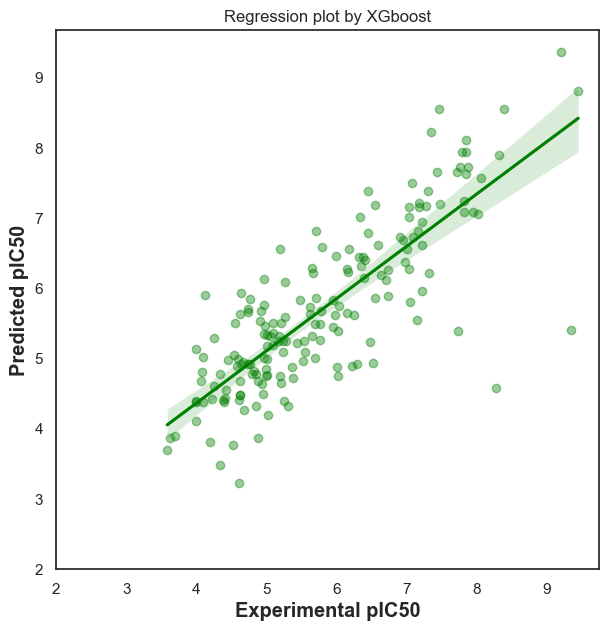

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(color_codes=True)
sns.set_style("white")

ax=sns.regplot(data=CompareDFs_xg, x="Actual", y="Predicted", scatter_kws={'alpha':0.4}, color="green")
ax.set_xlabel('Experimental pIC50', fontsize='large', fontweight='bold')
ax.set_ylabel('Predicted pIC50', fontsize='large', fontweight='bold')
ax.set_title('Regression plot by XGboost')
ax.set_xlim(2,)
ax.set_ylim(2,)
ax.figure.set_size_inches(7, 7)
plt.show

# DecisionTreeRegressor

In [66]:
from sklearn.tree import DecisionTreeRegressor 
dtr = DecisionTreeRegressor(random_state = 350) 
dtr.fit(X_train_scaled, y_train)
dtr2=dtr.score(X_train_scaled, y_train)
dtr2

0.9897674377732472

In [67]:
y_pred = dtr.predict(X_test_scaled)

# Model Performance

In [68]:
from sklearn.metrics import mean_squared_error, r2_score
print('Mean squared error (MSE): %.2f'
      % mean_squared_error(y_test, y_pred))
print('Coefficient of determination (R^2): %.2f'
      % r2_score(y_test, y_pred))

Mean squared error (MSE): 0.84
Coefficient of determination (R^2): 0.48


In [69]:
CompareDFs_dtr = pd.DataFrame({'Actual':y_test, 'Predicted': y_pred})
CompareDFs_dtr

,Actual,Predicted
549,5.270835,5.659556
574,6.450997,7.050610
452,5.700929,7.221849
194,7.327902,6.823909
662,4.886057,4.408935
285,7.040959,7.420216
124,6.551294,7.468521
131,7.958607,7.055517
493,5.481486,5.657577
174,8.283997,4.113002


<function matplotlib.pyplot.show(close=None, block=None)>

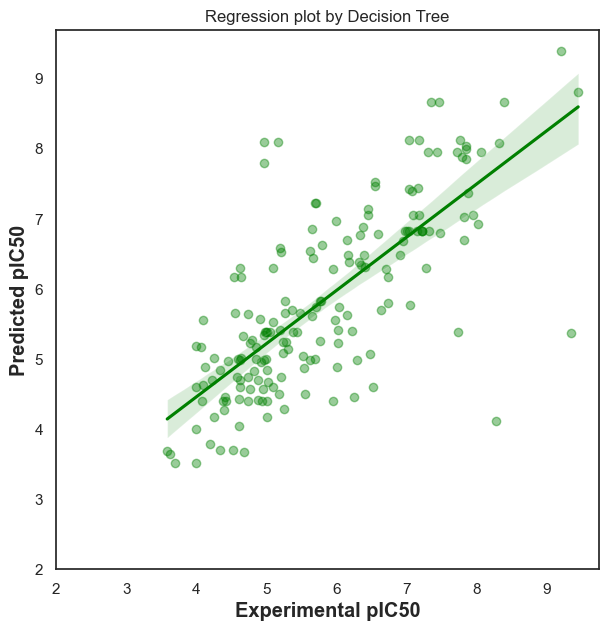

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(color_codes=True)
sns.set_style("white")

ax=sns.regplot(data=CompareDFs_dtr, x="Actual", y="Predicted", scatter_kws={'alpha':0.4}, color="green")
ax.set_xlabel('Experimental pIC50', fontsize='large', fontweight='bold')
ax.set_ylabel('Predicted pIC50', fontsize='large', fontweight='bold')
ax.set_title('Regression plot by Decision Tree')
ax.set_xlim(2, )
ax.set_ylim(2, )
ax.figure.set_size_inches(7, 7)
plt.show

# Save the model 

In [71]:
import pickle

In [72]:
pickle.dump(rfg, open('mixx_rfg.pkl', 'wb'))